In [1]:
include("harvey.jl")
using .julia


using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions


using NLopt

using Plots
using StatsPlots  
using Distributions
using DataFrames

## Simulate

In [2]:
# Define initial state and covariance
n_order = 4  # Adjust based on your model
state_dim = 2 + 2 * n_order
alpha_init = zeros(state_dim)
P1 = Matrix{Float64}(I(state_dim))*100  # Initial covariance matrix

# True parameters for simulation
rho = 0.6
lambda_c = 1.5
sigma_xi2 = 0.006
sigma_kappa2 = 0.007
sigma_epsilon2 = 0.009
params_true = [rho, lambda_c, sigma_xi2, sigma_kappa2, sigma_epsilon2]

n_obs = 300  # Number of observations

# Simulate data
y, alpha = simulate_data(params_true, n_order, n_obs, alpha_init)


([-0.06125939036639755, 0.04669852613438497, -0.24061919236865073, -0.15792548513337806, -0.2724206902588364, -0.2474598501244736, 0.4988899276577259, -0.4442556637900177, -2.206269097712262, -1.3861067143457504  …  -594.7783608100788, -597.1928150709232, -600.8569064436936, -606.9976576005519, -611.0914653964785, -613.3194952414951, -617.4842904258508, -623.212741758805, -627.2850093187687, -630.8763840639359], [0.0 0.0 … 0.0 0.0; 0.0 -0.11334296443503664 … 0.0 0.0; … ; -626.7309119291525 -4.03909714965504 … -0.4618115230715381 0.1397097129754777; -630.7700090788076 -3.9191081699952144 … -0.07472646662614998 0.08623026443601858])

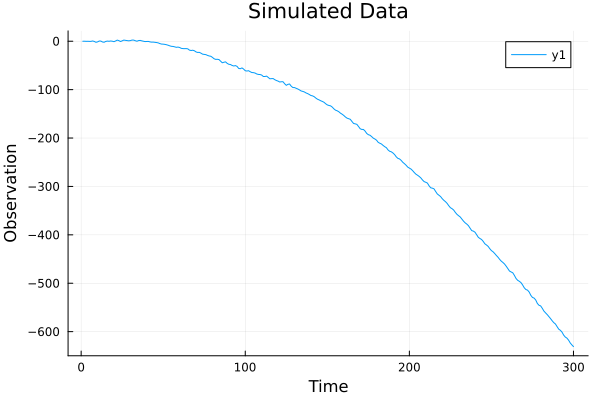

In [3]:
using Plots

plot(y, title="Simulated Data", xlabel="Time", ylabel="Observation")


## Estimate

In [4]:
#Define model
n_order = n_order
state_dim = 2 + 2 * n_order
alpha_init = zeros(state_dim)
alpha_init[1] = y[1]
P1 = Matrix{Float64}(I(state_dim))*100  # Initial covariance matrix

#Priors
a_rho = 0.01
b_rho = 0.97
a_lambda = 0.1
b_lambda = π
a_xi = 1e-6
b_xi = 1e-6
a_kappa = 1e-6
b_kappa = 1e-6
a_epsilon = 1e-6  
b_epsilon = 1e-6
priors = [a_rho, b_rho, a_lambda, b_lambda, a_xi, b_xi, a_kappa, b_kappa, a_epsilon, b_epsilon]




10-element Vector{Float64}:
 0.01
 0.97
 0.1
 3.141592653589793
 1.0e-6
 1.0e-6
 1.0e-6
 1.0e-6
 1.0e-6
 1.0e-6

In [5]:
# Run MCMC initialization
chain_init_burned, Sigma, acceptance_rate_init, chain_init = initialize_mcmc(
    y,
    priors,
    alpha_init, 
    P1, 
    n_order; 
    n_init=40000, 
    burn_init=20000, 
    omega_init=0.03)


Initialization Phase 100%|███████████████████████████████| Time: 0:00:45


Initialization Acceptance Rate: 4.7625 %


([0.30887615910100497 -0.1631734789406859 … -4.546694287350719 -4.980614218435399; 0.30887615910100497 -0.1631734789406859 … -4.546694287350719 -4.980614218435399; … ; 0.36693301791484584 -0.1762036373752076 … -4.567847436490165 -4.738910651493463; 0.36693301791484584 -0.1762036373752076 … -4.567847436490165 -4.738910651493463], [0.006633882114256698 0.0003921302390844197 … -0.015545261348623165 0.007172503492228102; 0.0003921302390844197 0.0006790177420322034 … -0.0013991828726221851 -0.00039999597576320797; … ; -0.015545261348623165 -0.0013991828726221851 … 0.04962280813561175 -0.02260702745775589; 0.007172503492228102 -0.00039999597576320797 … -0.02260702745775589 0.10211897546078652], 0.047625, [0.0 0.0 … 0.0 0.0; -0.08845108122434288 0.16947647492091975 … -0.11616964476409113 -0.1558030259712402; … ; 0.36693301791484584 -0.1762036373752076 … -4.567847436490165 -4.738910651493463; 0.36693301791484584 -0.1762036373752076 … -4.567847436490165 -4.738910651493463])

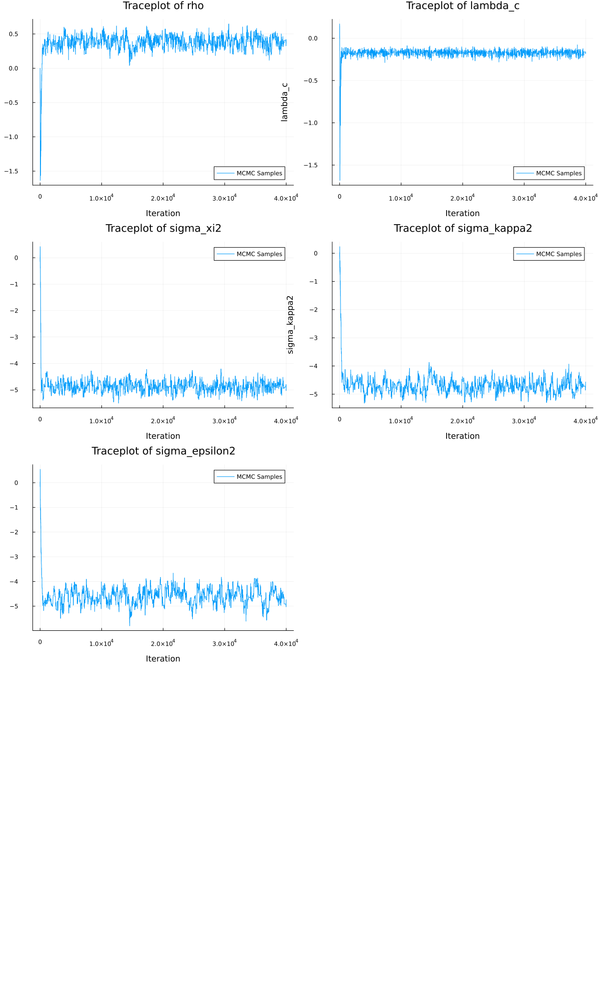

In [6]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)


# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples_init = chain_init[:, i]
    
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples_init, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")

    
    # Add plots to the list
    push!(p_list, p2)
end

# Display the plots in a grid layout
nrows = n_params
ncols = 2
plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))


In [7]:
# Run MCMC recursion
theta_samples_burned, alpha_samples, acceptance_rate_rec = recursion_mcmc(
    y, 
    priors,
    alpha_init, 
    P1, 
    n_order, 
    chain_init_burned, 
    Sigma; 
    n_rec=20000, 
    burn_rec=10000, 
    omega_rec=0.7)


Recursion Phase 100%|████████████████████████████████████| Time: 0:00:54


Recursion Acceptance Rate: 39.04 %


([0.5988795019932784 1.4839291744190188 … 0.0073803650063517965 0.010381447658110448; 0.6007416846319827 1.481924114105948 … 0.006401215323918357 0.012471191883472375; … ; 0.5563527057623735 1.4751935030512855 … 0.011668838406329736 0.006182075105603698; 0.5458434202980584 1.4749119828228434 … 0.013034607416224886 0.007206458591262916], Any[[-0.27544084690979354 0.00478973744446709 … 0.3265939323655722 1.591468251987214; -0.27065110945154114 -0.035503276134319806 … 0.06639887431759917 1.5000131982707714; … ; -622.529463318021 -4.368181834043112 … -0.7166402997292518 -0.5496948687658635; -626.8976451520641 -4.3519563376845944 … -0.4061527167971605 0.5619050494029645], [-1.6230782712562721 0.3703991547005927 … 1.798133271324465 2.84053666046551; -1.252679116592688 0.3013473391303698 … 1.18570205239428 -1.0686319333564764; … ; -622.5130708760234 -4.15036786850439 … -0.7869860663392161 -0.7121449262445473; -626.6634387445279 -4.121516442717787 … -0.6795804639347676 0.40754602787814664], [-

In [8]:

# Initial guesses for parameters
initial_params = [0.5, 0.2, 0.5, 0.5, 0.5]

# Bounds for parameters
lower_bounds = [0.0, 0.0, 1e-6, 1e-6, 1e-6]
upper_bounds = [0.999, π, Inf, Inf, Inf]


# Define the objective function
function obj(params::Vector, grad::Vector)
    try
        return negative_log_likelihood(params, y, alpha_init, P1, n_order)
    catch e
        return 1e10  # Return a large number in case of error
    end
end

# Create the optimizer
opt = Opt(:LN_NELDERMEAD, length(initial_params))
opt.lower_bounds = lower_bounds
opt.upper_bounds = upper_bounds
opt.min_objective = obj
opt.maxeval = 1000
opt.xtol_rel = 1e-6

# Run the optimization
(minf, estimated_params, ret) = NLopt.optimize(opt, initial_params)

# Display the estimated parameters
println("Estimated Parameters: ", estimated_params)


Estimated Parameters: [0.6148111770835756, 1.4510299031960083, 0.005659904776647361, 0.0037928750981633405, 0.3866553353417664]


In [9]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)


5

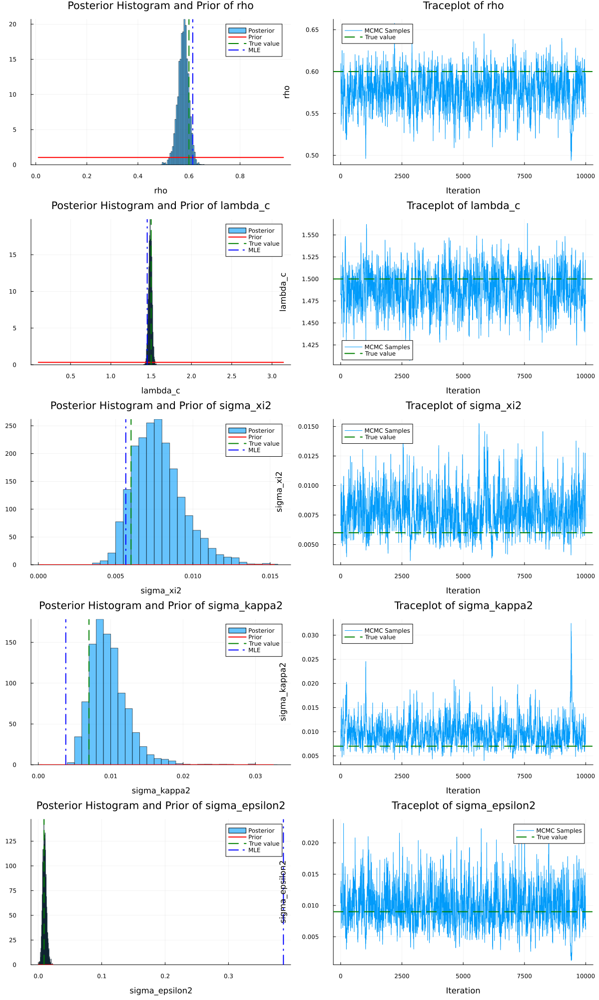

In [10]:
# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples = theta_samples_burned[:, i]
    
    # Histogram of posterior samples
    p1 = histogram(param_samples, bins=50, normalize=true, alpha=0.6,
                   label="Posterior", xlabel=parameters[i], ylabel="Density",
                   title="Posterior Histogram and Prior of $(parameters[i])")
    
    # Define the prior distribution
    if parameters[i] == "rho"
        # Uniform prior between 0 and 0.999
        a = a_rho
        b = b_rho
        x_values = range(a, b, length=200)
        prior_pdf = pdf.(Uniform(a, b), x_values)
    elseif parameters[i] == "lambda_c"
        # Uniform prior between 0 and π
        a = a_lambda
        b = b_lambda
        x_values = range(a, b, length=200)
        prior_pdf = pdf.(Uniform(a, b), x_values)
    else
        # Inverse-Gamma prior with a=3, b=1
        a_ig = a_epsilon
        b_ig = b_epsilon
        x_min = 0.0
        x_max = maximum(param_samples)
        x_values = range(x_min, x_max, length=200)
        prior_pdf = pdf.(InverseGamma(a_ig, b_ig), x_values)
    end
    
    # Overlay prior PDF on histogram
    plot!(p1, x_values, prior_pdf, label="Prior", color=:red, linewidth=2)
    
    # Include true parameter value
    vline!(p1, [params_true[i]], label="True value", color=:green, linestyle=:dash, linewidth=2)
    
    # If you have MLE estimates, include them (uncomment and define `estimated_params`)
    vline!(p1, [estimated_params[i]], label="MLE", color=:blue, linestyle=:dashdot, linewidth=2)
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")
    hline!(p2, [params_true[i]], label="True value", color=:green, linestyle=:dash, linewidth=2)
    
    # Add plots to the list
    push!(p_list, p1)
    push!(p_list, p2)
end

# Display the plots in a grid layout
nrows = n_params
ncols = 2
plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))


In [11]:
# Calculate means of posterior samples
chain_rec_burned_means = mean(theta_samples_burned, dims=1)  # 1 x n_params array
chain_rec_burned_means = vec(chain_rec_burned_means)  # Convert to a vector


5-element Vector{Float64}:
 0.577410690803907
 1.4888805474740097
 0.0077786015912317905
 0.009753988186531767
 0.009854438202023325

In [12]:

# Create the DataFrame
data = DataFrame(Dict(
    "Parameter" => parameters,
    "MCMC Estimate" => chain_rec_burned_means,
    "MLE Estimate" => estimated_params,  # Include if available
    "True Value" => params_true
))

# Display the DataFrame
display(data)


Row,MCMC Estimate,MLE Estimate,Parameter,True Value
,Float64,Float64,String,Float64
1,0.577411,0.614811,rho,0.6
2,1.48888,1.45103,lambda_c,1.5
3,0.0077786,0.0056599,sigma_xi2,0.006
4,0.00975399,0.00379288,sigma_kappa2,0.007
5,0.00985444,0.386655,sigma_epsilon2,0.009


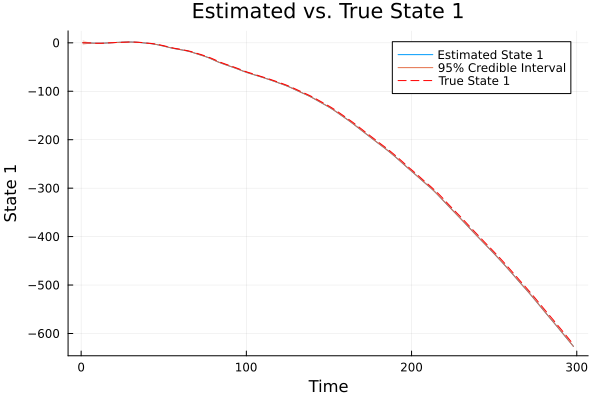

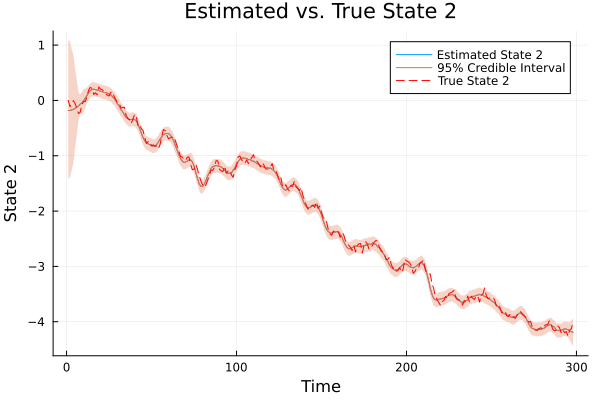

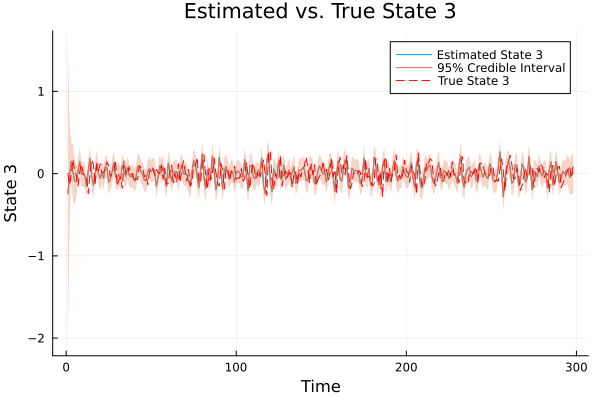

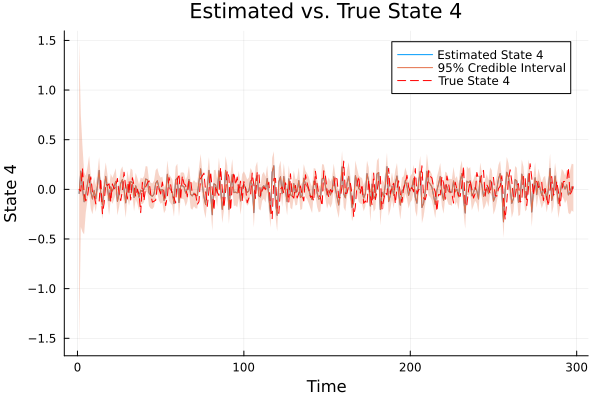

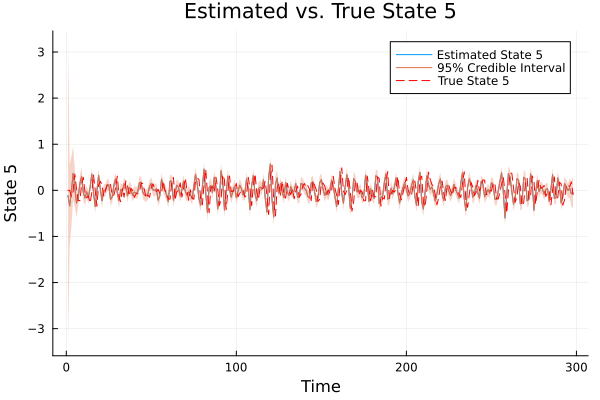

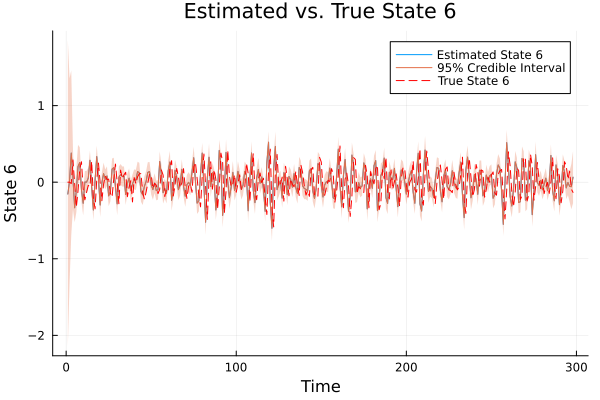

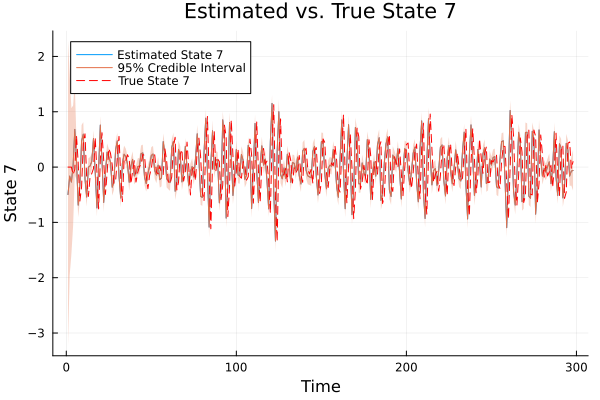

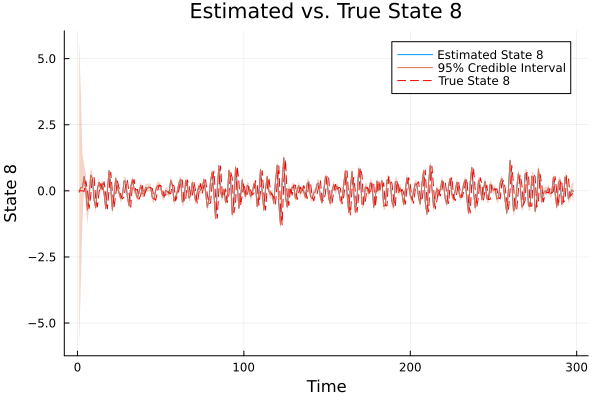

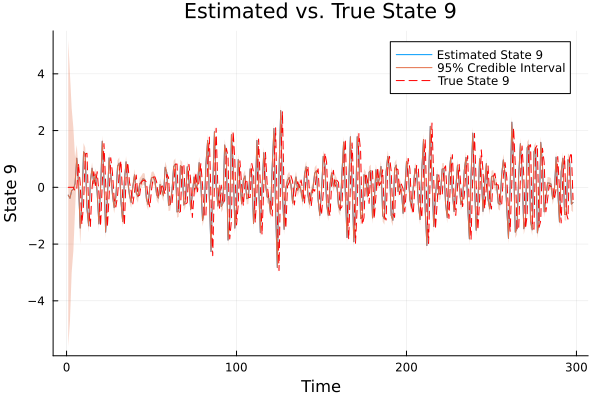

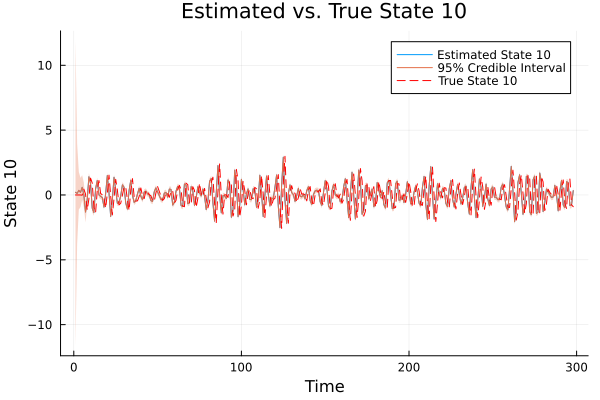

In [13]:
# Collect alpha samples into a 3D array
n_samples = length(alpha_samples)
n_time_steps = size(alpha_samples[1], 1)
state_dim = size(alpha_samples[1], 2)

# Initialize array to hold alpha samples
alpha_samples_array = Array{Float64}(undef, n_samples, n_time_steps, state_dim)

for i in 1:n_samples
    alpha_samples_array[i, :, :] = alpha_samples[i]
end


# Compute posterior mean over samples (dimension 1)
alpha_mean = mean(alpha_samples_array, dims=1)  # 1 x n_time_steps x state_dim
alpha_mean = dropdims(alpha_mean; dims=1)  # n_time_steps x state_dim

# Compute credible intervals
alpha_lower = mapslices(x -> quantile(x, 0.025), alpha_samples_array; dims=1)
alpha_lower = dropdims(alpha_lower; dims=1)
alpha_upper = mapslices(x -> quantile(x, 0.975), alpha_samples_array; dims=1)
alpha_upper = dropdims(alpha_upper; dims=1)



time = 1:n_time_steps

for s in 1:state_dim
    p = plot(time, alpha_mean[:, s], label="Estimated State $(s)", xlabel="Time",
             ylabel="State $(s)", title="Estimated vs. True State $(s)")
    
    # Add credible intervals using the `ribbon` argument
    plot!(time, alpha_mean[:, s], ribbon=(alpha_mean[:, s] .- alpha_lower[:, s],
          alpha_upper[:, s] .- alpha_mean[:, s]), fillalpha=0.3, label="95% Credible Interval")
    
    # Plot true state (assuming you have `alpha_true` from data simulation)
    plot!(time, alpha[1:n_time_steps, s], label="True State $(s)", linestyle=:dash, color=:red)
    
    display(p)
end


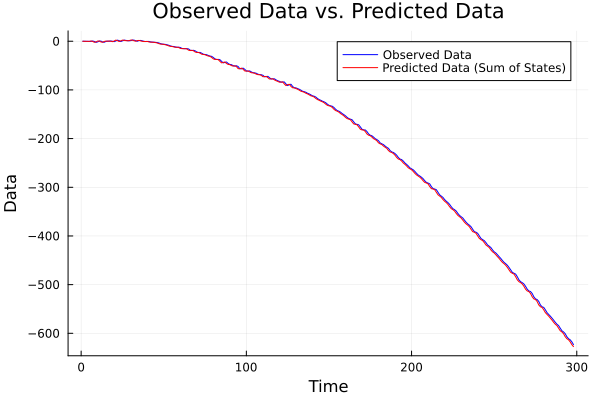

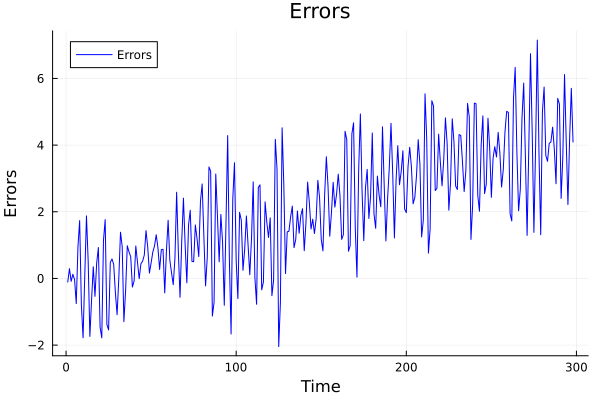

In [14]:
# Compute y_pred
# Adjust indices according to your state-space model
state_indices = [1, 2 + 2 * n_order-1]  

y_pred = alpha_mean[:, state_indices[1]] .+ alpha_mean[:, state_indices[2]]


# Adjust time and observed data if necessary
# If y_pred has fewer time points than y, adjust y accordingly
time = 1:length(y_pred)
y_adjusted = y[1:length(y_pred)]  # Adjust if lengths differ

p = plot(time, y_adjusted, label="Observed Data", color=:blue)
plot!(p, time, y_pred, label="Predicted Data (Sum of States)", color=:red)
xlabel!("Time")
ylabel!("Data")
title!("Observed Data vs. Predicted Data")
display(p)


errors = y_adjusted .- y_pred

p_error = plot(time, errors, label="Errors", color=:blue)
xlabel!("Time")
ylabel!("Errors")
title!("Errors")
display(p_error)
